In [1]:
%pylab inline
import cv2

Populating the interactive namespace from numpy and matplotlib


# Segmentación de Imágenes Usando la Transformada Watershed

La *Transformada Watershed* es un algortimo que permite realizar segmentación de imágenes. Así como el algoritmo Canny que trabajamos la clase pasada, es un paso preliminar a la aplicación de la transformada de Hough para la parametrización de los segmentos identificados.  

En la sección 11.5 del libro Digital Image Processing using Matlab de Gonzalez, Woods y Eddings que les subí a Sicua+ (les subí la versión de una versión más actual que la que había subido el lunes) encuentran una descripción del método y cómo implementarlo en Matlab. El objetivo de este taller es familiarizarse con algunos de los algoritmos de procesamiento de imágenes que permiten segmentar y parametrizar características de imágenes con el fin de desarrollar un método de granulometría de metales.  

Con el fin de satisfacer los objetivos planteados se le pide:  

* Leer el archivo de granulometría que va a analizar.  
* Reproducir el resultado mostrado en la Figura 11.28 de la referencia utilizando la herramienta OpenCV. Para esto se recomienda inicialmente revisar y reproducir:  
    * https://stackoverflow.com/questions/11294859/how-to-define-the-markers-for-watershed-in-opencv  
    * https://docs.opencv.org/3.3.1/d3/db4/tutorial_py_watershed.html  
* Ajustar el procedimiento para que segmente eficientemente las imágenes de granulometría.  
* Aplicar la transformada de Hough para parametrizar los segmentos identificados. Para esto se recomienda probar con círculos o elípses para determinar cuál tiene un mejor rendimiento.  
* Extraer la distribución de diámetros de los granos identificados.  
* Generar un histograma de la distribución de tamaño de grano encontrado.  

Text(0.5,1,'Imagen Original')

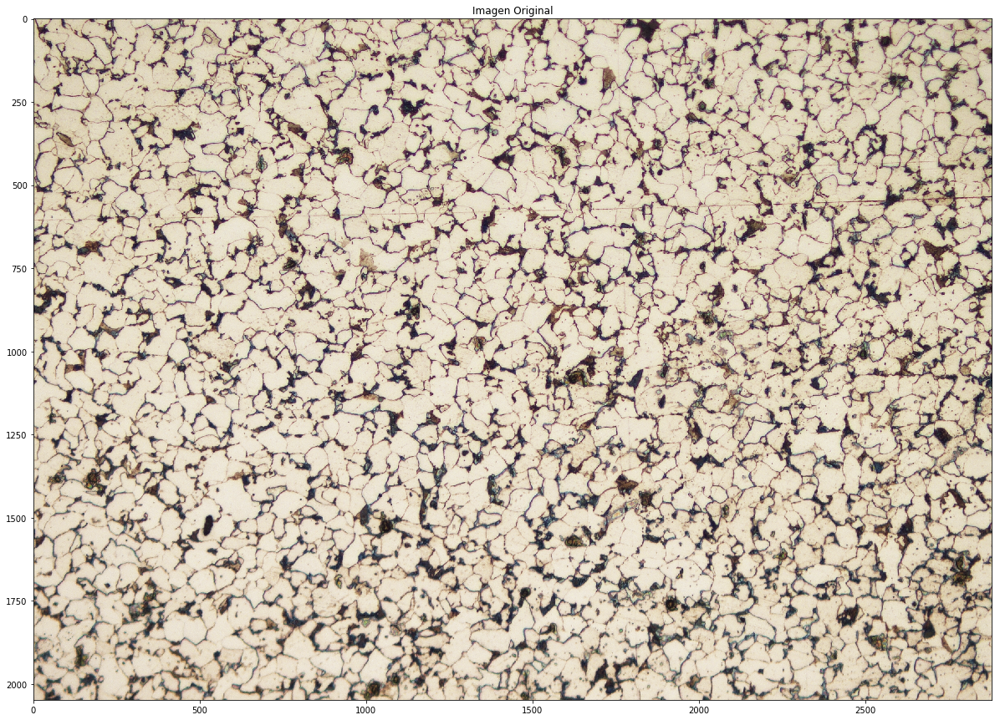

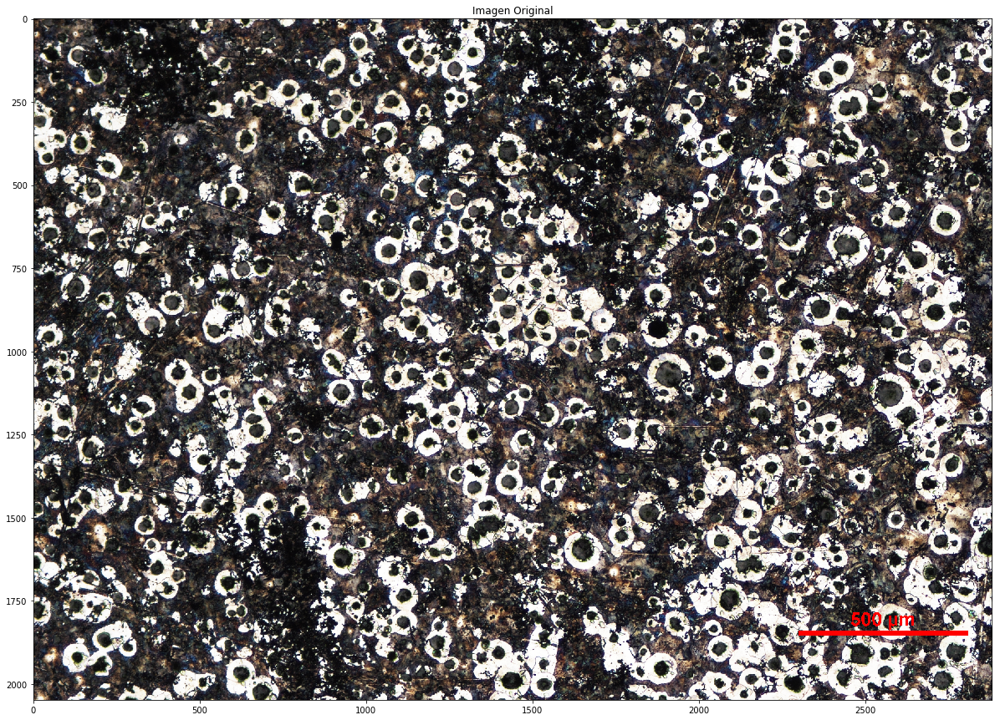

In [82]:
from PIL import Image
Img1 = Image.open("200x_1010_T.tif")
Im1=array(Img1)
Img2 = Image.open("FeNod_50X_L.tif")
Im2=array(Img2)
#print imagen
figure(1)
pylab.imshow(Im1)
plt.title('Imagen Original', fontsize=12)

figure(2)
pylab.imshow(Im2)
plt.title('Imagen Original', fontsize=12)

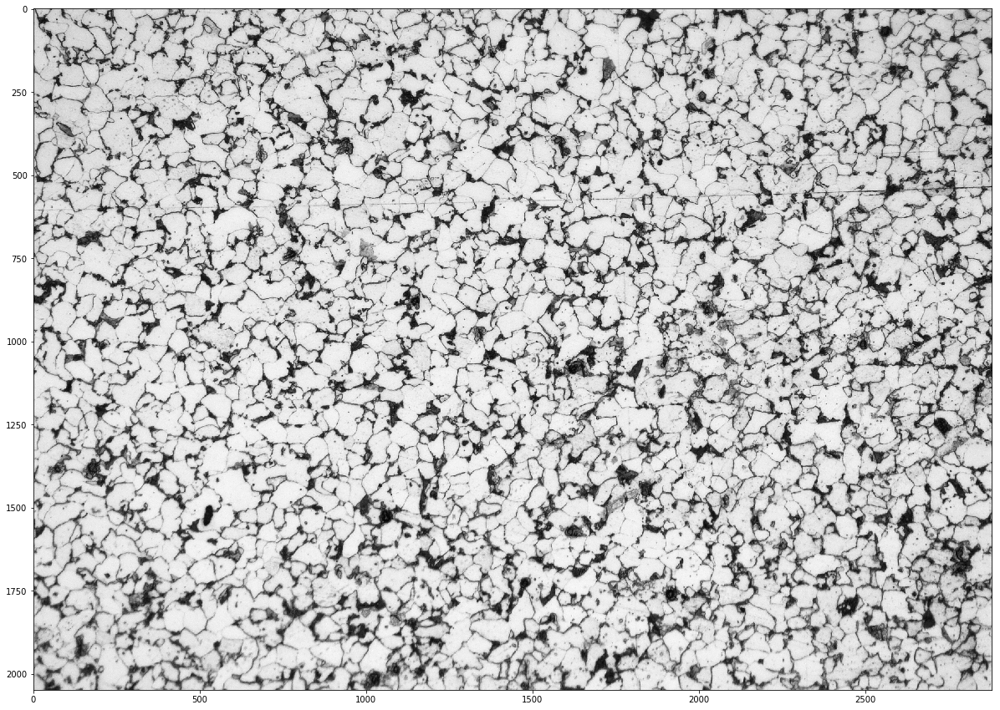

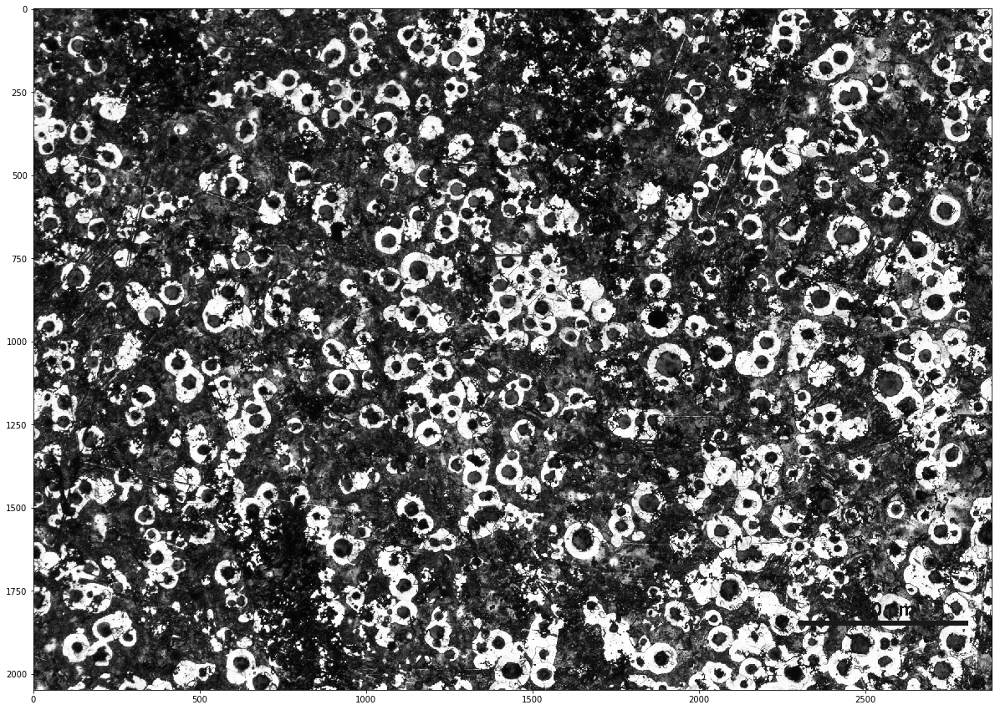

In [83]:
Im1Gray=cv2.cvtColor(Im1, cv2.COLOR_BGR2GRAY)
Im2Gray=cv2.cvtColor(Im2, cv2.COLOR_BGR2GRAY)
figure(1)
imshow(Im1Gray,'gray')
plt.show()
figure(2)
imshow(Im2Gray,'gray')
plt.show()
#plt.close()

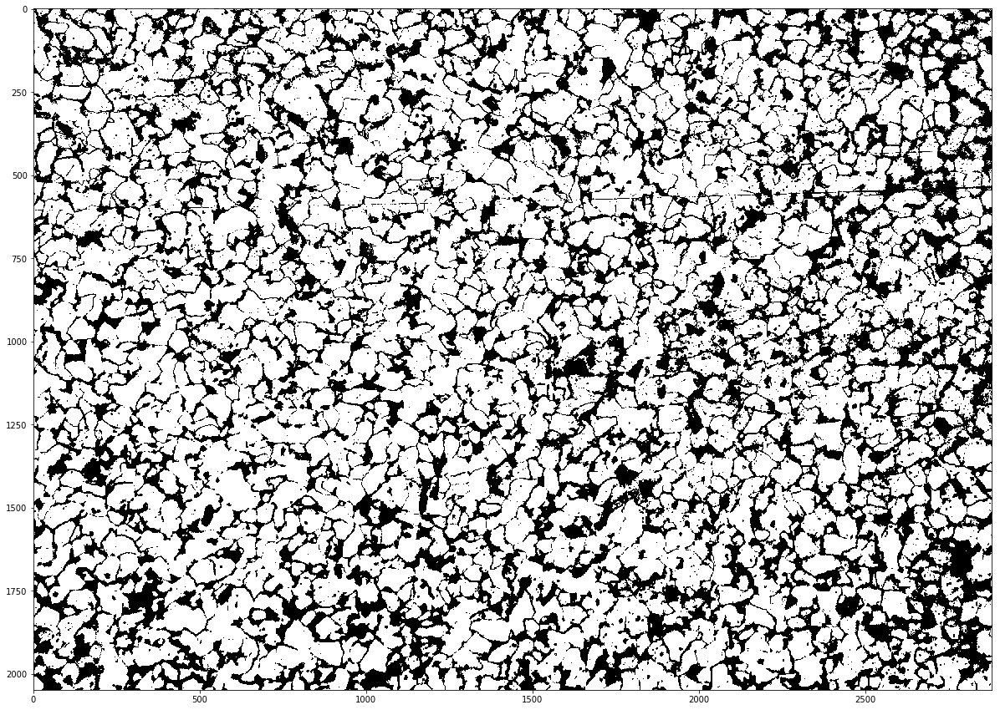

In [105]:
ret1,thresh1 = cv2.threshold(Im1Gray,180,250,cv2.THRESH_BINARY)
imshow(thresh1, 'gray')

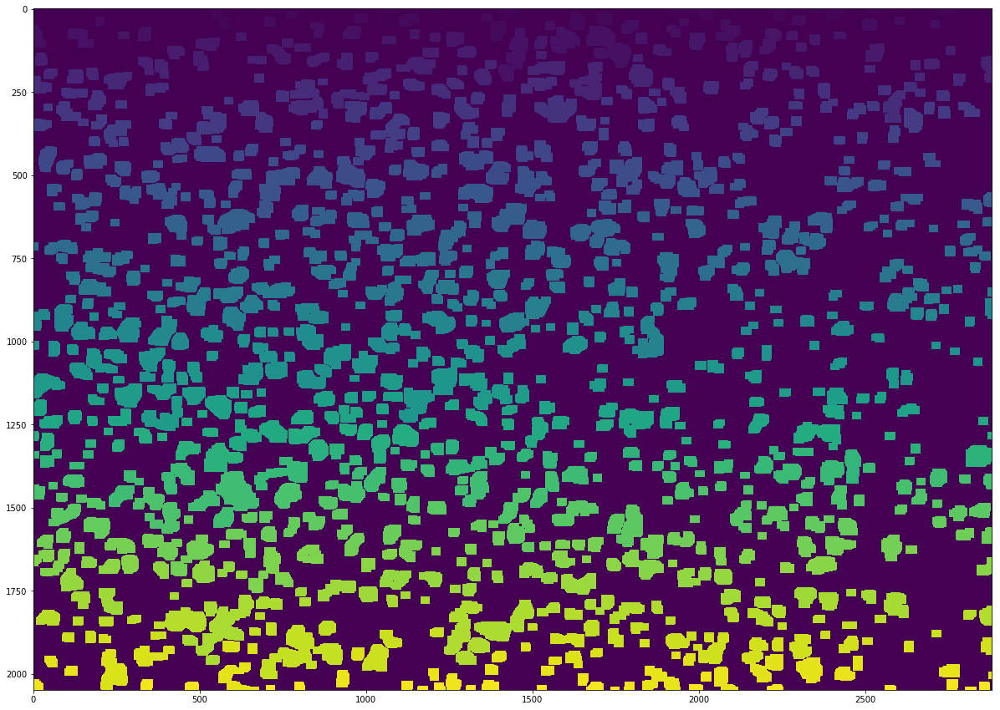

In [111]:
# noise removal
kernel = np.ones((8,10),np.uint8)
opening = cv2.morphologyEx(thresh1,cv2.MORPH_OPEN,kernel, iterations = 3)
# sure background area
sure_bg = cv2.dilate(opening,kernel,iterations=2)
# Finding sure foreground area
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,3)
ret, sure_fg = cv2.threshold(dist_transform,0.015*dist_transform.max(),200,0)

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
#markers = markers+1
# Now, mark the region of unknown with zero
#markers[unknown==255] = 255

#markers = cv2.watershed(Im1,markers)
Im1[markers ==1]=[0,0,0]
Im1[markers == -1] = [255,0,0]

imshow(markers)